In [313]:
import pandas as pd
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx


In [314]:
pd.set_option('display.max_columns',None)

In [315]:
df1 = pd.read_excel("Avaliações_Jogos.xlsx")
df2 = pd.read_excel("Categorias_Jogos.xlsx")
df3 = pd.read_excel("Infos_Jogos.xlsx")

In [316]:
df = pd.concat([df1, df2, df3], axis = 1)

DICIONÁRIO DE CADA COLUNA:

index - numbered index

objectid - the identifier on boardgamegeeks.com

name - name of the game #a que deve aparecer nos gráficos

yearpublished - the year the game was published

sortindex - rank of the game on bbg.com #bbg.com não existe?

minplayer - minumum number of players per the publishers 

maxplayers - maximum number of players per the publishers

minplaytime - minimum playtime required per the publishers

maxplaytime - maximum playtime per the publishers

minage - minimum age requiremnet per the publishers

min_community - minimum players per the community 

max_community - max players per the community

totalvotes - total number of community vote 

playerage - minimum age requirement per the community

languagedependence - a rank of amount of in-game text is required during game play #se tem muito ou pouco texto, numa escala numérica

'(no votes)':0,
'Extensive use of text - massive conversion needed to be playable':4,
'Moderate in-game text - needs crib sheet or paste ups':3,
'No necessary in-game text':1,
'Some necessary text - easily memorized or small crib sheet':2,
'Unplayable in another language':5

userrated - number of users that have rated the game

average - user average rating from 1-10

baverage - from the site, determined to be an anti-skewing effort by bgg
with system added mid range ratings (from 1-10)

stddev - average standard deviation of a rating #se o jogo tem um desvio padrão de notas muito alto

avgweight - a complexity rating from 1-5 Weight #complexidade do jogo é um fator importante pois pode traçar perfil de cliente

numweights - number of weight votes

numgeeklists - number of geeks with game on list

numtrading - number of people trading the game  #oferta do jogo

numwanting - number of people wanting the game  #demanda do jogo (acredito que seja um dos mais imporantes)

numcomments - number of comments on the site on this game

siteviews - number of views on the site

numplays - number of times game was played (according to site users?)

numplays_month - number of plays per month

news - number news articles on game

blogs - number of blogs regarding game

weblink - number of weblinks for the game

podcast - number of podcasts on the game #(???)

label - category of game (mostly boardgame)

boardgamedesigner_cnt - count of designers

boardgameartist_cnt - artist count

boardgamepublisher_cnt - publisher count

boardgamehonor_cnt - awards count

boardgamecategory_cnt - category count #acredito que um parâmetro bom seja separar por número de categorias e numero de mecanicas

boardgamemechanic_cnt - game mechanics count

boardgameexpansion_cnt - expansion count

boardgameversion_cnt - version count (languages)

boardgamefamily_cnt - game family count

boardgamedesigner - list of game designers

boardgameartist - list of game artists

boardgamepublisher - list of publishers

boardgamehonor - list of awards

boardgamecategory - list of categories

boardgameversion - list of versions

boardgamemechanic - a list of mechanics

boardgameexpansion - a list of expansions

boardgamefamily - a list of boardgames family

description - full text description of game

gamelink - a link to the game on bgg

In [317]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20016 entries, 0 to 20015
Data columns (total 53 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   objectid                20016 non-null  int64  
 1   min_community           14149 non-null  float64
 2   max_community           14816 non-null  float64
 3   totalvotes              19920 non-null  float64
 4   playerage               19919 non-null  object 
 5   languagedependence      20016 non-null  int64  
 6   usersrated              19919 non-null  float64
 7   average                 19918 non-null  float64
 8   baverage                19920 non-null  float64
 9   stddev                  20016 non-null  float64
 10  avgweight               20016 non-null  float64
 11  numweights              20016 non-null  int64  
 12  numgeeklists            20016 non-null  int64  
 13  numtrading              20016 non-null  int64  
 14  numwanting              20016 non-null

In [318]:
df.describe()

,objectid,min_community,max_community,totalvotes,languagedependence,usersrated,average,baverage,stddev,avgweight,numweights,numgeeklists,numtrading,numwanting,numcomments,siteviews,numplays,numplays_month,news,blogs,weblink,podcast,objectid,boardgamedesigner_cnt,boardgameartist_cnt,boardgamepublisher_cnt,boardgamehonor_cnt,boardgamecategory_cnt,boardgamemechanic_cnt,boardgameexpansion_cnt,boardgameversion_cnt,boardgamefamily_cnt,object_id,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage
count,20016.000000,14149.000000,14816.000000,19920.000000,20016.000000,19919.000000,19918.000000,19920.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,2.001600e+04,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000,20016.000000
mean,88671.356815,3.203336,4.277740,13.462149,1.354766,740.750038,6.275196,5.297070,1.499604,1.931676,48.044265,244.166617,40.102168,39.363659,191.489309,7.630316e+04,2304.061651,16.017386,0.518285,10.146882,6.254247,1.942896,88671.356815,1.338979,1.379097,2.500300,0.435651,2.567696,2.306705,1.185252,3.392536,1.429307,88671.356815,1981.279976,10001.834782,2.055256,5.591427,68.080735,94.271533,9.475120
std,90648.089927,1.398786,2.154951,57.198432,1.397114,3101.894657,1.064695,1.495368,0.340845,0.897099,198.045039,1078.734481,94.117323,113.465381,606.767699,2.251689e+05,13621.625923,111.335380,1.283211,38.765771,11.052996,7.953819,90648.089927,0.786757,4.767245,5.082079,1.609228,1.366424,1.707665,6.806901,12.313072,1.728051,90648.089927,219.137802,5774.059572,0.745471,15.043261,466.317247,1005.354972,3.739411
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.830000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-3500.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5857.500000,2.000000,3.000000,1.000000,0.000000,47.000000,5.712525,5.502950,1.309850,1.255250,4.000000,24.000000,4.000000,2.000000,21.000000,1.163275e+04,55.000000,0.000000,0.000000,0.000000,1.000000,0.000000,5857.500000,1.000000,0.000000,1.000000,0.000000,2.000000,1.000000,0.000000,1.000000,0.000000,5857.500000,1997.000000,5000.750000,2.000000,4.000000,20.000000,30.000000,8.000000
50%,39284.500000,3.000000,4.000000,3.000000,1.000000,105.000000,6.354050,5.545080,1.471530,1.910900,9.000000,59.000000,12.000000,8.000000,44.000000,2.365400e+04,177.000000,0.000000,0.000000,1.000000,3.000000,0.000000,39284.500000,1.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.000000,2.000000,1.000000,39284.500000,2008.000000,10003.500000,2.000000,4.000000,30.000000,45.000000,10.000000
75%,169680.500000,4.000000,5.000000,7.000000,2.000000,334.000000,6.955568,5.675205,1.663863,2.500000,25.000000,177.000000,35.000000,26.000000,122.000000,5.786500e+04,703.000000,3.000000,1.000000,6.000000,7.000000,1.000000,169680.500000,2.000000,2.000000,2.000000,0.000000,3.000000,3.000000,0.000000,3.000000,2.000000,169680.500000,2015.000000,15001.250000,2.000000,6.000000,60.000000,90.000000,12.000000
max,295770.000000,31.000000,31.000000,1868.000000,5.000000,90730.000000,9.442860,8.584240,4.500000,5.000000,7104.000000,121243.000000,2311.000000,2068.000000,17143.000000,8.933078e+06,627501.000000,5694.000000,30.000000,1158.000000,212.000000,577.000000,295770.000000,21.000000,508.000000,174.000000,50.000000,14.000000,18.000000,444.000000,1002.000000,86.000000,295770.000000,2021.000000,20000.000000,10.000000,999.000000,60000.000000,120000.000000,25.000000


LIMPEZA: 
- Duplicatas: existem jogos com nomes iguais, porém não devem existir jogos com o mesmo "gamelink" e "sortindex".

Obs: "objectid" contém 3 números repetidos após a limpeza do "sortindex", porém representam jogos diferentes.

In [319]:
a=df[df.duplicated(subset='sortindex', keep=False)]
a["sortindex"].value_counts()                           #quantos valores se repetem em'sortindex'

sortindex
974      2
2965     2
3338     2
4742     2
7154     2
10436    2
10470    2
12141    2
13419    2
14342    2
14819    2
16638    2
17325    2
18938    2
19087    2
19937    2
Name: count, dtype: int64

In [320]:
df.drop_duplicates(subset='gamelink', inplace=True)  #APAGANDO DUPLICATAS

- Irrelevante: coluna "Label" apenas possui um valor.

In [321]:
df['label'].nunique() #qnts valores diferentes tem em "label"

1

In [322]:
df.drop(columns='label', inplace=True)    #APAGANDO COLUNA IRRELEVANTE

-Nulos: 

In [323]:
df.isnull().sum().head(9)

objectid                 0
min_community         5859
max_community         5197
totalvotes              96
playerage               97
languagedependence       0
usersrated              97
average                 97
baverage                96
dtype: int64

In [324]:
df[df['usersrated'].isnull()].head()

,objectid,min_community,max_community,totalvotes,playerage,languagedependence,usersrated,average,baverage,stddev,avgweight,numweights,numgeeklists,numtrading,numwanting,numcomments,siteviews,numplays,numplays_month,news,blogs,weblink,podcast,objectid,boardgamedesigner_cnt,boardgameartist_cnt,boardgamepublisher_cnt,boardgamehonor_cnt,boardgamecategory_cnt,boardgamemechanic_cnt,boardgameexpansion_cnt,boardgameversion_cnt,boardgamefamily_cnt,boardgamedesigner,boardgameartist,boardgamepublisher,boardgamehonor,boardgamecategory,boardgameversion,boardgamemechanic,boardgameexpansion,boardgamefamily,gamelink,object_id,name,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage
353,171668,4.0,5.0,142.0,10,2,NaN,7.23252,7.01356,1.25886,1.9200,275,1997,492,358,2042,526373,46614,173,5,173,39,55,171668,2,1,9,7,2,5,1,13,1,"['Fabien Riffaud""', 'Juan Rodriguez""']",['Tignous'],"['Sweet Games', 'BoardM Factory', 'CMON Limite...",['2015 Cardboard Republic Daredevil Laurel Nom...,"['Card Game', 'World War I']","['English first edition', 'English second edit...","['Communication Limits', 'Cooperative Game', '...",['The Grizzled: At Your Orders!'],['The Grizzled'],/boardgame/171668/grizzled,171668,The Grizzled,2015,354,2,5,30,30,14
437,271896,3.0,4.0,80.0,10,4,NaN,7.79597,6.92466,1.37628,2.4592,98,314,42,439,530,403456,6479,357,1,28,8,11,271896,2,49,8,0,5,5,0,9,2,"['Corey Konieczka""', 'Tony Fanchi""']","['Borja Pindado Arribas', 'Balaskas', 'Tiziano...","['Fantasy Flight Games', 'ADC Blackfire Entert...",['None'],"['Adventure', 'Exploration', 'Movies / TV / Ra...","['Czech edition', 'English edition', 'French e...","['Dice Rolling', 'Modular Board', 'Pick-up and...",['None'],"['Solitaire Games', 'Star Wars']",/boardgame/271896/star-wars-outer-rim,271896,Star Wars Outer Rim,2019,438,1,4,120,180,14
479,216734,2.0,4.0,44.0,8,3,NaN,7.75384,6.87890,1.52580,2.0588,51,357,100,232,770,265538,11067,119,1,25,8,8,216734,2,1,2,0,4,4,2,3,2,"['Nate Chatellier""', 'Manny Trembley""']",['Manny Trembley'],"['Mind Bottling Games', 'Roxley']",['None'],"['Card Game', 'Dice', 'Fantasy', 'Fighting']","['Champion deluxe edition', 'Retail edition', ...","['Dice Rolling', 'Take That', 'Team-Based Game...","['Dice Throne Adventures', 'Dice Throne: Promo...","['Crowdfunding: Kickstarter', 'Dice Throne']",/boardgame/216734/dice-throne-season-one,216734,Dice Throne Season One,2018,480,2,6,20,40,8
681,171669,3.0,4.0,63.0,10,1,NaN,7.11733,6.70614,1.13213,2.3697,165,1375,247,193,844,266721,11328,42,5,78,43,20,171669,1,1,4,1,2,4,0,7,2,"['C\\u00e9drick Chaboussit""']",['Vincent Dutrait'],"['Ludonaute', 'Asterion Press', 'Meeple BR Jog...",['2015 Golden Geek Best Board Game Artwork/Pre...,"['American West', 'Dice']","['English edition', 'French edition', 'German ...","['Deck', 'Dice Rolling', 'Set Collection', 'Wo...",['None'],"['Historical Figures: Lewis & Clark', 'Native...",/boardgame/171669/discoveries-journals-lewis-a...,171669,Discoveries The Journals of Lewis and Clark,2015,682,2,4,60,60,14
1254,8098,5.0,8.0,105.0,6,1,NaN,6.52259,6.34343,1.51281,1.1417,628,1727,245,74,2094,479865,41583,181,4,31,58,11,8098,2,3,27,2,4,1,2,52,1,"['Thomas Vuarchex""', 'Pierrick Yakovenko""']","['Franz Vohwinkel', 'Thomas Vuarchex', 'Pierri...","['Asmodee', 'ADC Blackfire Entertainment', 'As...",['2003 Kinderspielexperten 8-to-13-year-olds N...,"['Action / Dexterity', 'Card Game', 'Party Gam...",['Asmodee Dutch/French deluxe edition with woo...,['Pattern Recognition'],"['Jungle Speed: Mini-extension inu00e9dite', '...",['Jungle Speed Series'],/boardgame/8098/jungle-speed,8098,Jungle Speed,1997,1255,2,8,10,10,7


- Outliers:

In [325]:
df.describe()

,objectid,min_community,max_community,totalvotes,languagedependence,usersrated,average,baverage,stddev,avgweight,numweights,numgeeklists,numtrading,numwanting,numcomments,siteviews,numplays,numplays_month,news,blogs,weblink,podcast,objectid,boardgamedesigner_cnt,boardgameartist_cnt,boardgamepublisher_cnt,boardgamehonor_cnt,boardgamecategory_cnt,boardgamemechanic_cnt,boardgameexpansion_cnt,boardgameversion_cnt,boardgamefamily_cnt,object_id,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage
count,20000.000000,14141.000000,14803.000000,19904.000000,20000.00000,19903.000000,19903.000000,19904.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,2.000000e+04,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000
mean,88670.822200,3.203522,4.277917,13.464480,1.35465,740.719389,6.275235,5.297634,1.499691,1.931761,48.059050,244.243000,40.097900,39.376050,191.515100,7.632353e+04,2304.163050,16.018050,0.518000,10.146900,6.255150,1.943050,88670.822200,1.339200,1.379250,2.500100,0.436000,2.568050,2.306900,1.185750,3.392800,1.429500,88670.822200,1981.268700,10000.500000,2.055250,5.59215,68.096450,94.28945,9.476350
std,90649.972355,1.398935,2.155624,57.215368,1.39713,3102.350251,1.064903,1.494510,0.340743,0.897206,198.113638,1079.125263,94.094807,113.503485,606.892077,2.252393e+05,13625.576506,111.374578,1.282754,38.772952,11.053866,7.956222,90649.972355,0.787003,4.768926,5.082961,1.609824,1.366515,1.707764,6.809425,12.317236,1.728375,90649.972355,219.223277,5773.647028,0.745537,15.04921,466.502106,1005.75196,3.738842
min,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.830000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-3500.000000,1.000000,0.000000,0.00000,0.000000,0.00000,0.000000
25%,5858.750000,2.000000,3.000000,1.000000,0.00000,47.000000,5.712550,5.502980,1.309920,1.255050,4.000000,24.000000,4.000000,2.000000,21.000000,1.163450e+04,55.000000,0.000000,0.000000,0.000000,1.000000,0.000000,5858.750000,1.000000,0.000000,1.000000,0.000000,2.000000,1.000000,0.000000,1.000000,0.000000,5858.750000,1997.000000,5000.750000,2.000000,4.00000,20.000000,30.00000,8.000000
50%,39278.500000,3.000000,4.000000,3.000000,1.00000,105.000000,6.354030,5.545145,1.471575,1.910900,9.000000,59.000000,12.000000,8.000000,44.000000,2.366050e+04,177.000000,0.000000,0.000000,1.000000,3.000000,0.000000,39278.500000,1.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.000000,2.000000,1.000000,39278.500000,2008.000000,10000.500000,2.000000,4.00000,30.000000,45.00000,10.000000
75%,169698.750000,4.000000,5.000000,7.000000,2.00000,334.000000,6.955685,5.675205,1.663782,2.500000,25.000000,178.000000,35.000000,26.000000,122.000000,5.791975e+04,703.250000,3.000000,1.000000,6.000000,7.000000,1.000000,169698.750000,2.000000,2.000000,2.000000,0.000000,3.000000,3.000000,0.000000,3.000000,2.000000,169698.750000,2015.000000,15000.250000,2.000000,6.00000,60.000000,90.00000,12.000000
max,295770.000000,31.000000,31.000000,1868.000000,5.00000,90730.000000,9.442860,8.584240,4.500000,5.000000,7104.000000,121243.000000,2311.000000,2068.000000,17143.000000,8.933078e+06,627501.000000,5694.000000,30.000000,1158.000000,212.000000,577.000000,295770.000000,21.000000,508.000000,174.000000,50.000000,14.000000,18.000000,444.000000,1002.000000,86.000000,295770.000000,2021.000000,20000.000000,10.000000,999.00000,60000.000000,120000.00000,25.000000


In [326]:
#df.loc[df['totalvotes'] > 1000, ['totalvotes','name']]

In [327]:
#deletadar = df[df.yearpublished <= 0].index #Pegando o index das pessoas com idade negativa
#df.drop(deletadar, inplace=True)

OBSERVAÇÕES SOBRE A LIMPEZA DE DADOS:
- Não entendemos a diferença entre min/max community e min/max players. Não representam o mesmo valor e parece que, oficialmente, número a ser considerado de máximo e mínimo de jogadores é o min/max players (feito pelo publisher do jogo). Outro fator que nos leva a tomar esse valor com análise é o alto número de informações faltando nas colunas max e min community (2023 e 1649)  <-- *ACHO Q TAVA ERRADO ESSES VALORES, ARRUMEI*
- Alguns outliers, olhando apenas para a tabela, nos pareceram bizarros como jogos criados 3500 antes de cristo e coisas do tipo. Por hora, construiremos alguns gráficos para entender se essas informações comprometem ou não a análise como um todo.
- Muitos jogos, como mostrado logo acima, apresentam poucos votos totais. Como um numero baixo de votos torna o desvio padrão muito alto e portanto uma avaliação pouco precisa de nota, faremos, inicialmente, um gráfico para entender a relação entre quantos votos cada jogo recebeu, e, a partir disso, estabelecer um piso para se avaliar características dos jogos em função a média de avaliações, objetivo central e principal da análise (saber se uma característica de um jogo é ou não relacionada com sua avaliação)
- 

ANÁLISES BÁSICAS SOBRE OS JOGOS: Entendendo o comportamento e distribuição de jogos na tabela

Nesta primeira parte, achei interessante classificar os jogos somente por fatores externos aos próprios jogos, como datas de lançamentos, avaliações, demandas, num de comentários ou coisas que não dizem respeito aos jogos em si para entender a influência destes fatores na popularidade dos jogos.

Mais para frente, analisaremos com cautela as caracterísitcas específicas dentro do jogo!

In [328]:
lancado = df[['yearpublished']]
lancado = lancado.value_counts()
lancado = lancado.sort_index(ascending=False)
lancado = lancado.iloc[0:100]
ano = list(range(2022,1922,-1))

fig=px.bar(x=ano, y=lancado)
fig.update_layout(
    title='Lançamentos de jogos nos últimos 100 anos',
    xaxis=dict(title='anos'),
    yaxis=dict(title='quantidade'))
fig.show()

In [329]:
df_filtered = df[df['yearpublished'] >= 1950]
total_jogos = len(df)
total_jogos_desde_1950 = len(df_filtered)
porcentagem_desde_1950 = (total_jogos_desde_1950 / total_jogos) * 100
fig = px.pie(
    names=['Publicados desde 1950', 'Antes de 1950'],
    values=[porcentagem_desde_1950, 100 - porcentagem_desde_1950],
    title='Porcentagem de Jogos Publicados a Partir de 1950',
)
fig.show()

A partir do exposto acima, tomamos nocão que quase todos os jogos (98% de 20000 = 19593) são lançados após 1950 e que portanto é descartável análisar jogos muito antigos, perdendo menos de 2% das informações presentes na base.


In [330]:
fig = px.scatter(
    df,
    x='usersrated',
    y='average',
    hover_name='name',
    title='Número de Avaliações vs. Avaliação Média',
    labels={'userrated': 'Número de Avaliações', 'average': 'Avaliação Média'},
    trendline='ols',  # Adiciona uma linha de tendência de regressão linear
)

# Exibir o gráfico
fig.show()

O breve insight obtido aqui é que, em geral, jogos com MUITAS avaliações apresntam notas razoáveis, e, portanto, ter muitas avaliações é um ponto positivo, uma vez que a reta de regressão linear é crescente e também indica popularidade do jogo.
Entretanto, não ficou claro o que está acontecendo em jogos com baixas avaliações.

In [331]:
count_per_ratings = df['usersrated'].value_counts().sort_index()

fig = px.bar(
    x=count_per_ratings.index,
    y=count_per_ratings.values,
    labels={'x': 'Número de Avaliações', 'y': 'Quantidade de Jogos'},
    title='Quantidade de Jogos por Número de Avaliações',
     range_x=[0, 100], 
)

fig.show()

INSIGHT!

É notória a quebra de padrão entre jogos com menos de 30 avaliações e mais de 30 avaliações, então os próximos gráficos vão comparar isto

obs do renan: (Nada me leva a crer que isso não foi proposital de quem organizou, e deve ter uns 10 easter eggs do tipo espalhado pela tabela)

In [332]:
df_less_than_30_reviews = df[df['usersrated'] < 30]
total_jogos = len(df)
total_jogos_menos_30_avaliacoes = len(df_less_than_30_reviews)
porcentagem_menos_30_avaliacoes = (total_jogos_menos_30_avaliacoes / total_jogos) * 100
fig = px.pie(
    names=['Menos de 30 Avaliações', '30 ou mais Avaliações'],
    values=[porcentagem_menos_30_avaliacoes, 100 - porcentagem_menos_30_avaliacoes],
    title='Porcentagem de Jogos com Menos de 30 Avaliações',
    hole=0.4 
)

fig.show()


In [333]:
df_less_than_30_reviews = df[df['usersrated'] < 30]
df_more_than_30_reviews = df[df['usersrated'] >=30]

media_stddev_less_than_30 = df_less_than_30_reviews['stddev'].mean()
media_stddev_more_than_30 = df_more_than_30_reviews['stddev'].mean()

fig = px.bar(
    x=['Menos de 30 Avaliações', '30 ou mais Avaliações'],
    y=[media_stddev_less_than_30, media_stddev_more_than_30],
    labels={'x': 'Número de Avaliações', 'y': 'Média do Desvio Padrão'},
    title='Média do Desvio Padrão entre Jogos com Menos e Mais de 30 Avaliações'
)
fig.update_yaxes(range=[1, 1.8])
fig.show()

bins = [0, 2, 10, 20, 40, 60, 100, 150, float('inf')]
labels = ['0-1','2-9', '10-19', '20-39', '40-59', '60-99', '100-149', '150+']

df['evaluation_range'] = pd.cut(df['usersrated'], bins=bins, labels=labels, right=False)

# Calcular a média do desvio padrão em cada categoria
df_grouped = df.groupby('evaluation_range')['stddev'].mean().reset_index()

# Criar um gráfico de barras
fig2 = px.bar(
    df_grouped,
    x='evaluation_range',
    y='stddev',
    title='Média do Desvio Padrão por Intervalo de Avaliações',
    labels={'stddev': 'Média do Desvio Padrão', 'evaluation_range': 'Intervalo de Avaliações'},
)
fig2.update_yaxes(range=[1.4, 1.6])
# Exibir o gráfico
fig2.show()

C:\Users\arthu\AppData\Local\Temp\ipykernel_18428\761882220.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



INSIGHT!!!

Analisando de imediato, surpreendentemente, parece jogos que apresentam menos de 30 avaliações NÃO apresentam desvio padrão de notas alto (na verdade, apresentam média de desvio padrão menor que os jogos com mais de 30 avaliações). Entretanto, analisando o segundo gráfico, vemos que isso se deve aos jogos que apresentam somente 1 voto e portanto desvio padrão nulo e, na verdade, a faixa de jogos entre 10 e 60 avaliações apresentam maior desvio padrão que jogos com 60 avaliações ou mais.


In [334]:

fig_scatter = px.scatter(
    df,
    x='numwanting',
    y='average',
    title='Demanda vs. Avaliação Média',
    labels={'numwanting': 'Número de Pessoas Querendo', 'average': 'Avaliação Média'},
    trendline='ols',
)
fig_scatter.show()

In [335]:
# Criei uma coluna para categorizar as faixas de avaliação
df['faixa_avaliacao'] = pd.cut(df['average'], bins=[0, 4, 5, 6, 7, 8, 9, 10], labels=['0-4', '4-5', '5-6', '6-7', '7-8', '8-9', '9-10'])
# média de demanda por intervalo 
media_demanda_por_faixa = df.groupby('faixa_avaliacao')['numwanting'].mean().reset_index()
fig = px.bar(
    media_demanda_por_faixa,
    x='faixa_avaliacao',
    y='numwanting',
    title='Média de Demanda por Jogo, por Nota Média',
    labels={'faixa_avaliacao': 'Faixa de Nota', 'numwanting': 'Média de Demanda'},
)
fig.show()


df['faixa_avaliacao'] = pd.cut(df['average'], bins=[0, 4, 5, 6, 7, 8, 9, 10], labels=['0-4', '4-5', '4-6', '6-7', '7-8', '8-9', '9-10'])

# Calcular o número total de avaliações para cada faixa de avaliação
total_avaliacoes_por_faixa = df.groupby('faixa_avaliacao')['usersrated'].mean().reset_index()

# Criar o gráfico de barras
fig1 = px.bar(
    total_avaliacoes_por_faixa,
    x='faixa_avaliacao',
    y='usersrated',
    title='Número Médio de Avaliações por Jogo, porNota média',
    labels={'faixa_avaliacao': 'Faixa de nota', 'usersrated': 'Número Médio de Avaliações'},
)

# Exibir o gráfico
fig1.show()

C:\Users\arthu\AppData\Local\Temp\ipykernel_18428\310457448.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



C:\Users\arthu\AppData\Local\Temp\ipykernel_18428\310457448.py:18: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



INSIGHTS!!

Primeiramente, há uma relação clara entre demanda e faixa de nota, (oras, a demanda cresce conforme a média de nota aumenta! Todos querem o jogo mais legal). Mas então, por quê a demanda para jogos com nota acima de 9 é tão menor??

Bom, analisando o segundo gráfico, vemos que o número médio de avaliações realizadas para jogos com média maior que 9 (69.45 avaliações) é muito menor que para jogos entre 7 e 9 (1880 avaliações). Frente a isso, visto o baixo número de avaliações, podemos concluir que são jogos -potencialmente- novos e, acima de tudo, pouco conhecidos no mercado. Isto, então, acende um alerta uma campanha de marketing direcionada a jogos recentes que já apresentam notas médias acima de 9 e não apresentam demanda clara, uma vez que esta ausência é fruto de ignorância e não desinteresse.

Seguindo então nessa linha, para validar nessa teoria, vamos acompanhar a demanda de jogos do útlimos anos e o número de avaliações atreladas a jogos mais recentes.

In [336]:
colors = ['#8A2BE2', '#FA8072']
df_before_2017 = df[df['yearpublished'] <= 2017]
df_after_2017 = df[df['yearpublished'] > 2017]

average_demand_before_2017 = df_before_2017['numwanting'].mean()
average_demand_after_2017 = df_after_2017['numwanting'].mean()

data_demand = {
    'Ano': ['Até 2017', 'Depois de 2017'],
    'Média de Demandas': [average_demand_before_2017, average_demand_after_2017]
}

df_demand = pd.DataFrame(data_demand)

fig_demand = px.pie(
    df_demand,
    names='Ano',
    values='Média de Demandas',
    title='Média de Demandas para Jogos Publicados Até e Depois de 2017',
    labels={'Média de Demandas': 'Média de Demandas'},
    color_discrete_sequence=colors,
)

df_high_rating = df[df['average'] > 9]

df_high_rating['Ano'] = df_high_rating['yearpublished'].apply(lambda x: 'Até 2017' if x <= 2017 else 'Depois de 2017')

count_high_rating = df_high_rating.groupby('Ano').size().reset_index(name='Quantidade')

fig_high_rating = px.pie(
    count_high_rating,
    names='Ano',
    values='Quantidade',
    title='Quantidade de Jogos com Nota Maior que 9 Lançados Antes e Depois de 2017',
    labels={'Quantidade': 'Número de Jogos'},
    color_discrete_sequence=colors,
)

fig_high_rating.show()
fig_demand.show()

df['Ano'] = df['yearpublished'].apply(lambda x: 'Depois de 2017' if x > 2017 else 'Até 2017')


count_by_year = df.groupby('Ano').size().reset_index(name='Quantidade')

colors = ['#FA8072','#8A2BE2']
fig = px.pie(
    count_by_year,
    names='Ano',
    values='Quantidade',
    title='Número de Jogos Lançados Depois e Até 2017',
    labels={'Quantidade': 'Número de Jogos'},
    color_discrete_sequence=colors,
)

fig.show()


C:\Users\arthu\AppData\Local\Temp\ipykernel_18428\4236530435.py:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Bingo! O primeiro gráfico mostra exatamente o previsto pelo dito anteriomente "-potencialmente- novo", e que mostra que 80% (16) dos jogos com nota maior que 9 surgiram nos últimos 5 anos (considerando a base de dados contendo informações relevantes até 2021), e portanto apresentam pouca demanda pois não são conhecidos ainda.

É fundamental também perceber que, apesar de somente 9.88% dos jogos terem sido lançados nos ultimos 5 anos, eles representam 59% da demanda atual. Portanto, é explcíto a preferência do público pelos jogos mais recentes.

In [337]:
media = df[['average','name']]
media = media.sort_values('average', ascending=False)
media = media.iloc[0:15]

fig=px.bar(media, x = 'name', y = 'average')
fig.update_layout(
    title='Top 15 jogos - alg coisa ta errada, esses jogos tem poucas avaliacoes',
    xaxis=dict(title='Jogo'),
    yaxis=dict(title='Nota'))
fig.update_yaxes(range=[9, 9.5])
fig.show()
#obs do renan: acho esse gráfico inútil, pq não da pra mapear nada aqui além de chutar que esses jogos em específico são bons sem motivos aparentes.
#edit: escrevi a obs acima antes de começar qualquer análise, mas depois de fazer os gráficos acima percebi que a maioria desses jogos são importantes para serem divulgados 
# se quiser apagar apaga, botei soh pra ver msm

In [338]:
popularidade = df[['usersrated', 'average','numgeeklists', 'numtrading', 'numwanting',
       'numcomments', 'siteviews', 'numplays', 'numplays_month', 'news', 'blogs', 'weblink', 'podcast']]

jogo = df[['usersrated', 'average', 'boardgamedesigner_cnt', 'boardgameartist_cnt', 'boardgamepublisher_cnt', 'boardgamehonor_cnt', 'boardgamecategory_cnt',
       'boardgamemechanic_cnt', 'boardgameexpansion_cnt', 'boardgameversion_cnt', 'boardgamefamily_cnt']]

dados = df[['usersrated', 'average', 'yearpublished', 'sortindex', 'minplayers', 'maxplayers', 'minplaytime', 'maxplaytime', 'minage', 'languagedependence', 'avgweight']]

<Axes: >

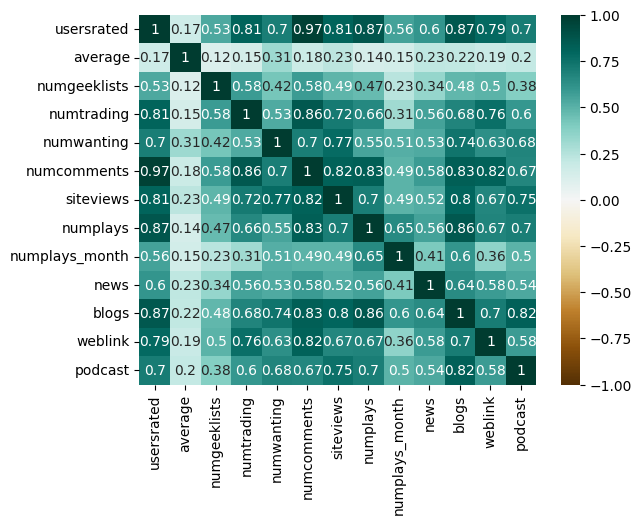

In [339]:
sns.heatmap(popularidade.corr(), annot=True, vmin=-1, vmax=1, cmap='BrBG')

<Axes: >

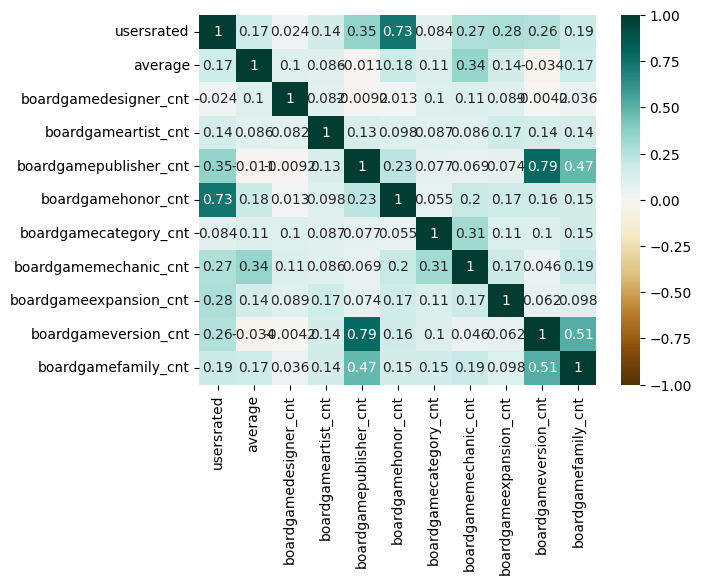

In [340]:
sns.heatmap(jogo.corr(),annot=True,vmin=-1, vmax=1, cmap='BrBG')   

<Axes: >

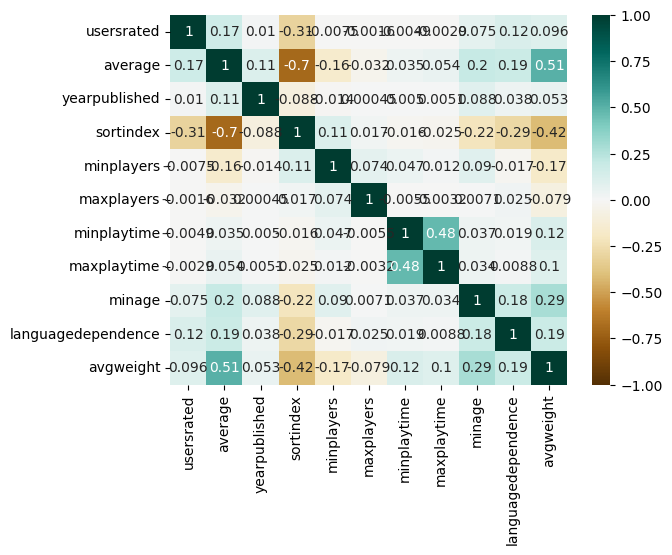

In [341]:
sns.heatmap(dados.corr(),annot=True,vmin=-1, vmax=1, cmap='BrBG')   

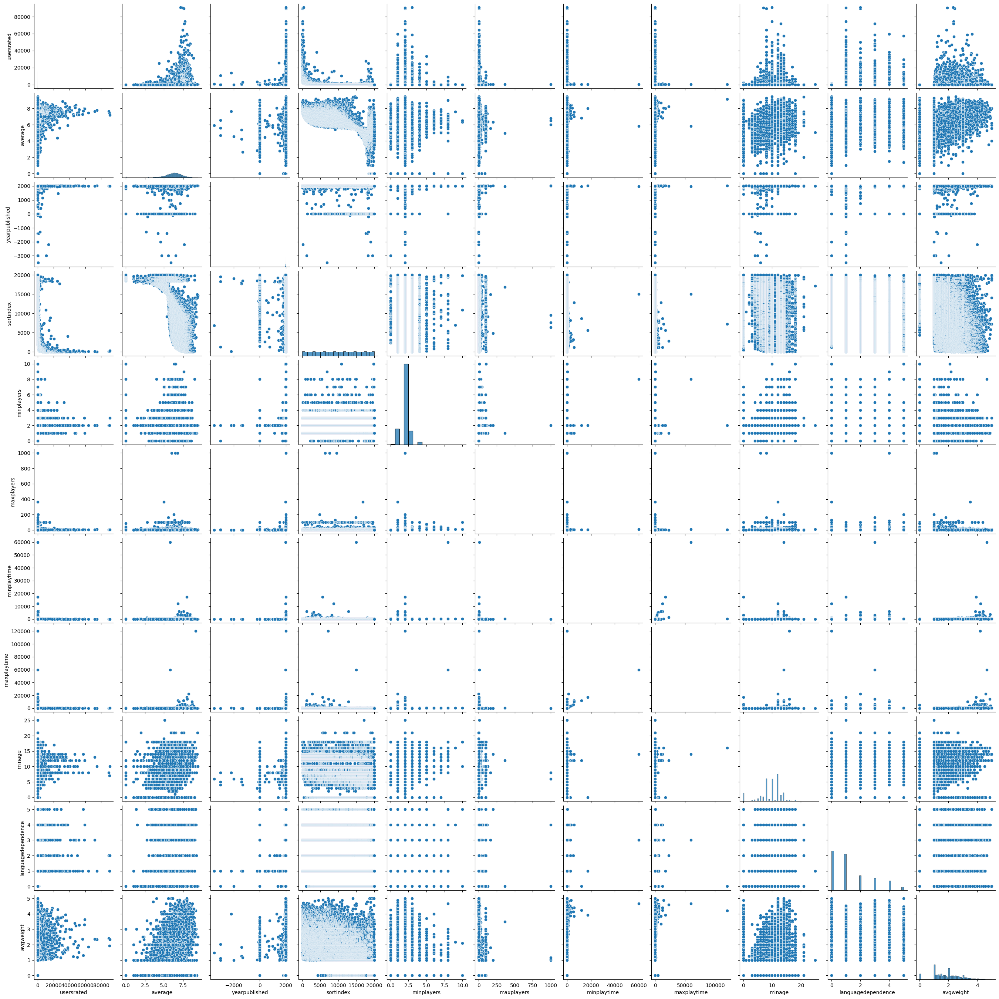

In [342]:
sns.pairplot(dados)

In [343]:
df.head()

,objectid,min_community,max_community,totalvotes,playerage,languagedependence,usersrated,average,baverage,stddev,avgweight,numweights,numgeeklists,numtrading,numwanting,numcomments,siteviews,numplays,numplays_month,news,blogs,weblink,podcast,objectid,boardgamedesigner_cnt,boardgameartist_cnt,boardgamepublisher_cnt,boardgamehonor_cnt,boardgamecategory_cnt,boardgamemechanic_cnt,boardgameexpansion_cnt,boardgameversion_cnt,boardgamefamily_cnt,boardgamedesigner,boardgameartist,boardgamepublisher,boardgamehonor,boardgamecategory,boardgameversion,boardgamemechanic,boardgameexpansion,boardgamefamily,gamelink,object_id,name,yearpublished,sortindex,minplayers,maxplayers,minplaytime,maxplaytime,minage,evaluation_range,faixa_avaliacao,Ano
0,174430,3.0,4.0,827.0,14,4,31254.0,8.85292,8.58424,1.59819,3.8078,1311,3657,313,1365,5972,8933078,230213,3478,7,471,31,139,174430,1,3,9,23,5,12,4,19,7,"['Isaac Childres""']","['Alexandr Elichev', 'Josh T. McDowell', 'Alva...","['Cephalofair Games', 'Albi', 'Asmodee', 'Feue...",['2017 Best Science Fiction or Fantasy Board G...,"['Adventure', 'Exploration', 'Fantasy', 'Fight...","['Chinese edition', 'Czech edition', 'English ...","['Campaign / Battle Card Driven', 'Cooperative...","['Gloomhaven: Forgotten Circles', 'Gloomhaven:...","['Campaign Games', 'Components: Miniatures', '...",/boardgame/174430/gloomhaven,174430,Gloomhaven,2017,1,1,4,60,120,12,150+,8-9,Até 2017
1,161936,4.0,4.0,549.0,12,4,34729.0,8.62499,8.47159,1.59463,2.8301,971,3612,272,771,5477,2971746,196621,1090,9,597,69,164,161936,2,1,11,20,2,8,0,33,3,"['Rob Daviau""', 'Matt Leacock""']",['Chris Quilliams'],"['Z-Man Games', 'Asterion Press', 'Devir', 'Fi...",['2015 Cardboard Republic Immersionist Laurel ...,"['Environmental', 'Medical']","['Chinese blue edition', 'Chinese red edition'...","['Action Points', 'Cooperative Game', 'Hand Ma...",['None'],"['Campaign Games', 'Legacy', 'Pandemic']",/boardgame/161936/pandemic-legacy-season-1,161936,Pandemic Legacy Season 1,2015,2,2,4,60,60,13,150+,8-9,Até 2017
2,167791,3.0,4.0,1252.0,12,3,48339.0,8.42299,8.26781,1.36938,3.2313,1863,5941,277,2068,7274,4724387,245997,4380,14,1158,60,148,167791,1,1,20,20,6,9,15,29,6,"['Jacob Fryxelius""']",['Isaac Fryxelius'],"['FryxGames', 'Arclight', 'Fantasmagoria', 'Gh...",['2016 Cardboard Republic Architect Laurel Nom...,"['Economic', 'Environmental', 'Industry / Manu...","['Bulgarian edition', 'Chinese edition', 'Czec...","['Card Drafting', 'End Game Bonuses', 'Hand Ma...",['French Championship Promo Cards (fan expansi...,"['Fryxgames Future Timeline', 'Planets: Mars',...",/boardgame/167791/terraforming-mars,167791,Terraforming Mars,2016,3,1,5,120,120,12,150+,8-9,Até 2017
3,182028,3.0,4.0,436.0,14,4,18269.0,8.49419,8.23513,1.49542,4.3850,891,2083,280,1049,2660,2448074,54284,511,5,185,30,42,182028,1,4,13,3,3,5,1,14,2,"['Vlaada Chv\\u00e1til""']","['Filip Murmak', 'Radim Pech', 'Jakub Politzer...","['Czech Games Edition', 'Cranio Creations', 'D...",['2015 Golden Geek Best Strategy Board Game No...,"['Card Game', 'Civilization', 'Economic']","['Chinese edition', 'Czech edition', 'English ...","['Action Points', 'Auction/Bidding', 'Auction:...",['Through the Ages: New Leaders and Wonders'],"['Tableau Building', 'Through the Ages']",/boardgame/182028/through-ages-new-story-civil...,182028,Through the Ages A New Story of Civilization,2015,4,2,4,120,120,14,150+,8-9,Até 2017
4,224517,3.0,4.0,242.0,14,1,10070.0,8.62031,8.20459,1.22876,3.9122,467,1039,37,1077,1702,894621,23336,815,3,124,13,21,224517,3,3,8,6,3,8,0,9,6,"['Gavan Brown""', 'Matt Tolman""', 'Martin Walla...","['Lina Cossette', 'David Forest', 'Damien Mamm...","['Roxley', 'BoardM Factory', 'Conclave Editora...",['2018 Golden Geek Best Board Game Artwork & P...,"['Economic', 'Industry / Manufacturing', 'Tran...","['English deluxe edition', 'English retail edi...","['Hand Management', 'Income', 'Loans', 'Market...",['None'],"['Beer', 'Brass', 'Cities: Birmingham (England...",/boardgame/224517/brass-birmingham,224517

In [355]:
print(df['boardgamecategory'].apply(pd.Series))

                                                       0
0      ['Adventure', 'Exploration', 'Fantasy', 'Fight...
1                           ['Environmental', 'Medical']
2      ['Economic', 'Environmental', 'Industry / Manu...
3              ['Card Game', 'Civilization', 'Economic']
4      ['Economic', 'Industry / Manufacturing', 'Tran...
...                                                  ...
19995                        ['Economic', 'Negotiation']
19996                              ['Abstract Strategy']
19997            ['Abstract Strategy', 'Childrens Game']
19998            ['Abstract Strategy', 'Childrens Game']
19999                              ['Abstract Strategy']

[20000 rows x 1 columns]


In [352]:
ml = df['boardgamecategory'].apply(pd.Series)
ml

,0
0,"['Adventure', 'Exploration', 'Fantasy', 'Fight..."
1,"['Environmental', 'Medical']"
2,"['Economic', 'Environmental', 'Industry / Manu..."
3,"['Card Game', 'Civilization', 'Economic']"
4,"['Economic', 'Industry / Manufacturing', 'Tran..."
...,...
19995,"['Economic', 'Negotiation']"
19996,['Abstract Strategy']
19997,"['Abstract Strategy', 'Childrens Game']"
19998,"['Abstract Strategy', 'Childrens Game']"


In [347]:
ml  = df[['boardgamedesigner', 'boardgameartist', 'boardgamepublisher', 'boardgamehonor', 'boardgamecategory', 
         'boardgameversion', 'boardgamemechanic', 'boardgameexpansion', 'boardgamefamily']]
teste = pd.get_dummies(ml['boardgamecategory'])
teste #precisa abrir as listas

,"['(Public Domain)', '(Self-Published)']","['(Public Domain)', 'Historical Collections Group plc', 'Oxford Games']","['(Self-Published)', '(Unknown)', '(Web published)', 'The Broken Token', 'Daedalus Productions']","['(Self-Published)', 'Broadway Toys LTD', 'cosaic']","['(Unknown)', 'The Toy Company Argentina S.R.L.']",['(Unknown)'],['(Unpublished)'],"['(Web published)', 'Piecepack Games']",['(Web published)'],"['1-2-3-Games u00c9ditions', 'Feelindigo', 'Trefl']",['1987 Spiel des Jahres Recommended'],['2004 Spiel der Spiele Hit mit Freunden Recommended'],"['2008 Japan Boardgame Prize Voters Selection Nominee', '2008 Spiel des Jahres Nominee', '2008 Spiel des Jahres Winner', '2009 u00c5rets Spill Best Family Game Nominee', '2009 Golden Geek Best Family Board Game Nominee', '2009 Gouden Ludo Nominee']","['2009 Golden Geek Best Childrens Board Game Nominee', '2009 Japan Boardgame Prize Voters Selection Nominee']",['2011 u00c5rets Spill Best Family Game Nominee'],"['2011/2012 Boardgames Australia Awards Best International Game Nominee', '2012 Deutscher Spiele Preis Best Family/Adult Game 3rd Place', '2012 Golden Geek Best Strategy Board Game Nominee', '2012 International Gamers Award - General Strategy: Multi-player Nominee', '2012 Spiel des Jahres Kennerspiel des Jahres Recommended']",['2013 Kinderspielexperten 8-to-13-year-olds Nominee'],['2013 Spiel der Spiele Hit fu00fcr Familien Recommended'],['2015 Best Australian Awards Best Australian Game Nominee'],"['2015 Cardboard Republic Socializer Laurel Nominee', '2015 Golden Geek Best Family Board Game Nominee', '2015 Mensa Select Winner', '2016 SXSW Tabletop Game of the Year Nominee']","['2015 Cardboard Republic Tactician Laurel Nominee', '2015 Golden Geek Best Board Game Artwork/Presentation Nominee', '2016 Jogo do Ano Nominee']","['2015 Gioco dellu2019Anno Nominee', '2015 Spiel der Spiele Hit mit Freunden Recommended']",['2017 Golden Geek Best Cooperative Game Nominee'],"['2017 Meeples Choice Nominee', '2018 Cardboard Republic Architect Laurel Nominee', '2018 International Gamers Award - General Strategy: Multi-player Nominee']","['2018 UK Games Expo Best Abstract Game Judges Award Winner', '2018 UK Games Expo Best Abstract Game Peoples Choice Winner']",['2019 Mensa Select Winner'],"['2F-Spiele', 'Arclight', 'Edge Entertainment', 'Rio Grande Games']",['999 Games'],"['ADC Blackfire Entertainment', 'Bankiiiz Editions', 'Rebel', 'SD Games']",['AMIGO'],"['APE Games', 'Cube Factory of Ideas']",['ASS Altenburger Spielkarten'],"['Abstract Strategy', 'Action / Dexterity', 'Ancient', 'Animals', 'City Building', 'Civilization']","['Abstract Strategy', 'Action / Dexterity', 'Book', 'Card Game', 'Deduction', 'Dice']","['Abstract Strategy', 'Action / Dexterity', 'Childrens Game', 'Dice', 'Fantasy']","['Abstract Strategy', 'Action / Dexterity', 'Childrens Game', 'Nautical']","['Abstract Strategy', 'Action / Dexterity', 'Childrens Game']","['Abstract Strategy', 'Action / Dexterity', 'Dice', 'Game System']","['Abstract Strategy', 'Action / Dexterity', 'Dice', 'Memory', 'Puzzle']","['Abstract Strategy', 'Action / Dexterity', 'Electronic', 'Maze', 'Memory', 'Puzzle']","['Abstract Strategy', 'Action / Dexterity', 'Maze', 'Puzzle']","['Abstract Strategy', 'Action / Dexterity', 'Maze', 'Racing']","['Abstract Strategy', 'Action / Dexterity', 'Maze']","['Abstract Strategy', 'Action / Dexterity', 'Medieval']","['Abstract Strategy', 'Action / Dexterity', 'Party Game']","['Abstract Strategy', 'Action / Dexterity', 'Puzzle']","['Abstract Strategy', 'Action / Dexterity', 'Racing']","['Abstract Strategy', 'Action / Dexterity']","['Abstract Strategy', 'Adventure', 'Ancient', 'Animals', 'Childrens Game', 'Dice']","['Abstract Strategy', 'Adventure', 'Bluffing', 'Card Game', 'Fantasy', 'Negotiation']","['Abstract Strategy', 'Adventure', 'Bluffing', 'Fighting', 'Negotiation', 'Political']","['Abstract Strategy', 'Adventure', 'Card Game', 'Collectible Components']","['Abstract Strategy', 'Adventure', 'Dice', 'Ex